In [1]:
using Plots
using CSV

In [2]:
eq00_ = [37.286735738112725 -.31987136E+03
32.315084830357826 -.32246742E+03
29.829320019933437 -.32353699E+03
27.343657477190508 -.32423230E+03
26.100763804447812 -.32440477E+03
24.857813393706287 -.32445978E+03
23.61494009770223 -.32441035E+03
22.37199783952496 -.32427972E+03
19.886203248733263 -.32389126E+03
17.400559939077816 -.32363353E+03
12.428890605444703 -.32458679E+03]

eq_1 = [0.0 -.30942677E+03
4.971643962034344 -.32429924E+03
7.4572736537374595 -.32660558E+03
9.9431347979044 -.32767849E+03
11.186003962501246 -.32791428E+03
12.4288906054447 -.32798879E+03
13.671830047301174 -.32791971E+03
14.914722534554533 -.32772588E+03
17.400559939077816 -.32708045E+03
19.886203248733263 -.32679847E+03
24.857813393706287 -.32666738E+03]

E_gap = 1.52 # eV
ΔE = 0.825  # eV

Q1_data = eq_1[:, 1]
E1_data = eq_1[:, 2] .- minimum(eq_1[:, 2]) .+ E_gap

Q2_data = eq00_[:, 1]
E2_data = eq00_[:, 2] .- minimum(eq00_[2:8, 2]) .+ E_gap .- ΔE .+ 0.1
# plt = scatter(Q2, E2)
E2_data[11] = 0.76+1.1


# import potential data
E_Q_1_data = CSV.read("../Potential_1_update.txt", header=false, delim='\t')
E_Q_2_data = CSV.read("../Potential_2_update.txt", header=false, delim='\t')

# convert data to matrix
E_Q_1 = convert(Matrix, E_Q_1_data)
E_Q_2 = convert(Matrix, E_Q_2_data)

# extract Q data
Q1 = E_Q_1[:,1]
Q2 = E_Q_2[:,1]

E1 = E_Q_1[:,2]
E2 = E_Q_2[:,2];

# # extract energies and convert to float
# E1 = map(x->parse(Float64,x),energies_1)
# E2 = map(x->parse(Float64,x),energies_2)

3000-element Array{Union{Missing, Float64},1}:
  2.047842206770725 
  2.047825591566135 
  2.0478089185039647
  2.047792187383142 
  2.0477753980018996
  2.047758550157771 
  2.0477416436475893
  2.0477246782674854
  2.0477076538128824
  2.0476905700784975
  2.047673426858337 
  2.0476562239456935
  2.047638961133145 
  ⋮                 
 14.8591279289193   
 14.882572343304018 
 14.906036333389594 
 14.929519899176038 
 14.953023040663366 
 14.97654575785155  
 15.000088050740608 
 15.023649919330543 
 15.047231363621338 
 15.070832383613004 
 15.094452979305549 
 15.118093150698956 

In [3]:
# E_shift = minimum(E1)

# E1 = E1 .- E_shift
# E2 = E2 .- E_shift

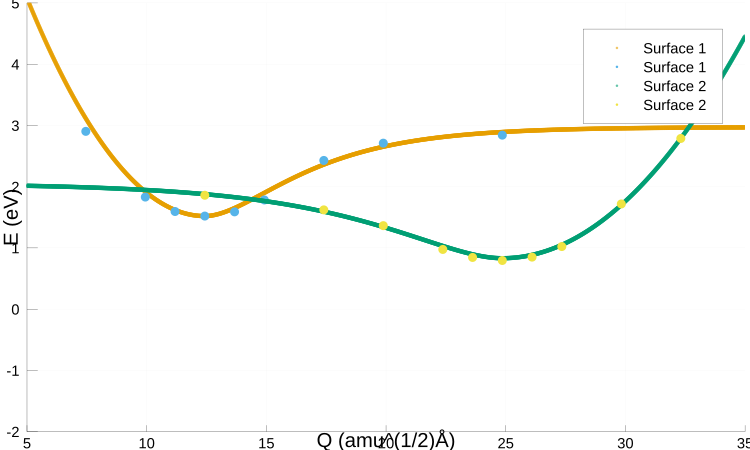

In [4]:
theme(:wong)
Plots.scalefontsizes(5)
default(size=(3000,1800))
scatter(Q1,E1,  markershape = :circle,
           markersize = 10,
           markeralpha = 0.6,
           markerstrokewidth = 3,
           markerstrokealpha = 0, label = "Surface 1")
scatter!(Q1_data, E1_data, markershape = :circle,
           markersize = 20,
           markerstrokewidth = 3,
           markerstrokealpha = 0, label = "Surface 1")
scatter!(Q2,E2,  markershape = :circle,
           markersize = 10,
           markeralpha = 0.6,
           markerstrokewidth = 3,
           markerstrokealpha = 0, label = "Surface 2")
scatter!(Q2_data, E2_data, markershape = :circle,
           markersize = 20,
           markerstrokewidth = 3,
           markerstrokealpha = 0, label = "Surface 2")
xlabel!("Q (amu^(1/2)Å)")
ylabel!("E (eV)")
ylims!(-2, 5)
xlims!(5, 35)
# savefig("defect_energy_surfaces.pdf")